# Import relevant packages

In [1]:
# Manually add environment's bin dir to the path inside notebook to run tensorboard
import os
#PATH = os.getenv('PATH')
#%env PATH=/home/theghub/naureenk/.conda/envs/crev/bin:$PATH
    
# Magic command to load tensorboard extension
%load_ext tensorboard
# Mute TF 2.12 Bug Warnings (Before importing tensorflow)
os.environ['TF_CPP_MIN_LOG_LEVEL'] = '2' 
import sys
# Appending the U-net package folder
sys.path.append("./src/")
import unet
#from unet import crevasse_data'
#from dataloader import DataLoader
import tensorflow as tf
from tensorflow import keras
from tensorflow.keras import losses, metrics
from tensorflow.keras.layers import Input, Conv2D, Dropout, MaxPooling2D, Activation, ReLU
from tensorflow.keras.layers import BatchNormalization, Conv2DTranspose, Concatenate
from tensorflow.keras.models import Model, Sequential
from IPython.display import Image, display
from tensorflow.keras.preprocessing.image import load_img
#keras.backend.set_image_data_format('channels_last')
import PIL
from PIL import ImageOps
print(f"Tensorflow ver. {tf.__version__}")

Tensorflow ver. 2.10.0


### Import Images and Labels to make tf datasets using dataloader class from DataLoader.py

In [2]:
IMAGE_DIR_PATH = "./gris/Images/"
MASK_DIR_PATH = "./gris/Labels/"
training_image_data = "./gris/Images/Train/"
valid_image_data = "./gris/Images/Valid/"
test_image_data = "./gris/Images/Test/"
training_mask_data = "./gris/Labels/Train/"
valid_mask_data = "./gris/Labels/Valid/"
test_mask_data = "./gris/Labels/Test/"
BATCH_SIZE = 1

# create list of PATHS
## Train
train_image_paths = [os.path.join(training_image_data, x) for x in os.listdir(training_image_data) if x.endswith('.png')]
train_mask_paths = [os.path.join(training_mask_data, x) for x in os.listdir(training_mask_data) if x.endswith('.png')]
## Valid
valid_image_paths = [os.path.join(valid_image_data, x) for x in os.listdir(valid_image_data) if x.endswith('.png')]
valid_mask_paths = [os.path.join(valid_mask_data, x) for x in os.listdir(valid_mask_data) if x.endswith('.png')]
## Test
test_image_paths = [os.path.join(test_image_data, x) for x in os.listdir(test_image_data) if x.endswith('.png')]
test_mask_paths = [os.path.join(test_mask_data, x) for x in os.listdir(test_mask_data) if x.endswith('.png')]

# Where image_paths[0] = 'data/training/images/image_0.png' 
# And mask_paths[0] = 'data/training/masks/mask_0.png'


## TF TRAIN DATASET
# Initialize the dataloader object
train_dataset = DataLoader(image_paths=train_image_paths,
                           mask_paths=train_mask_paths,
                           image_size=(1024,1024),
                           crop_percent=None,
                           channels=(1, 1),
                           palette=[0,128,255],
                           augment=True,
                           compose=True,
                           seed=None)

# Parse the images and masks, and return the data in batches, augmented optionally.
train_dataset = train_dataset.data_batch(batch_size=BATCH_SIZE,
                                         shuffle=False)


## TF VALID DATASET

# Initialize the dataloader object
valid_dataset = DataLoader(image_paths=valid_image_paths,
                           mask_paths=valid_mask_paths,
                           image_size=(1024,1024),
                           crop_percent=None,
                           channels=(1, 1),
                           palette=[0,128,255],
                           augment=False,
                           compose=False,
                           seed=None)

# Parse the images and masks, and return the data in batches, augmented optionally.
valid_dataset = valid_dataset.data_batch(batch_size=BATCH_SIZE)


## TF TEST DATASET

# Initialize the dataloader object
test_dataset = DataLoader(image_paths=test_image_paths,
                          mask_paths=test_mask_paths,
                          image_size=(1024,1024),
                          crop_percent=None,
                          channels=(1, 1),
                          palette=[0,128,255],
                          augment=False,
                          compose=False,
                          seed=None)

# Parse the images and masks, and return the data in batches, augmented optionally.
test_dataset = test_dataset.data_batch(batch_size=BATCH_SIZE)

In [2]:
%tensorboard --logdir crevasse_data

### Image and Label folder paths

In [2]:
# Create list of image/label paths
IMAGE_DIR_PATH = "./gris/Images/"
MASK_DIR_PATH = "./gris/Labels/"
#test_image_dir = "./gris/Images/Test/"
#test_mask_dir = "./gris/Images/Test/" 
#img_size = (1024,1024)
IMG_SIZE = (1024,1024)
batch_size = 1
input_img_paths = sorted([os.path.join(IMAGE_DIR_PATH, x) for x in os.listdir(IMAGE_DIR_PATH) if x.endswith('.png')])
target_img_paths = sorted([os.path.join(MASK_DIR_PATH, x) for x in os.listdir(MASK_DIR_PATH) if x.endswith('.png')])
print("Number of samples:", len(input_img_paths))
#test_img_paths = sorted([os.path.join(test_image_dir, x) for x in os.listdir(test_image_dir) if x.endswith('.png')])
#test_mask_paths = sorted([os.path.join(test_mask_dir, x) for x in os.listdir(test_mask_dir) if x.endswith('.png')])

Number of samples: 6


## Working TF input pipeline for U-Net

In [2]:
IMG_SIZE = (512,512)
#function to read image and mask from file
def read_image(image_name):
    image = tf.io.read_file(image_name)
    image = tf.image.decode_png(image, channels=1)
    image = tf.image.resize(image, IMG_SIZE)
    image = tf.cast(image, tf.float32)/255.0
    return image
    
def read_mask(mask_name):    
    mask = tf.io.read_file(mask_name)
    mask = tf.image.decode_png(mask, channels=1)
    mask = tf.image.resize(mask, IMG_SIZE)
    mask = tf.cast(mask, tf.uint8)
    #mask = tf.expand_dims(mask, axis=-1)
    return mask

data_augmentation = tf.keras.Sequential([
  tf.keras.layers.experimental.preprocessing.RandomFlip("horizontal"),
  tf.keras.layers.experimental.preprocessing.RandomRotation(0.25),
  tf.keras.layers.experimental.preprocessing.RandomContrast(0.1)],
  )

# Create TRAIN TF dataset of Images and Labels separately and then map the files to stream of images and labels
train_image_dataset = tf.data.Dataset.list_files("./gris/Images_HH_median/Train/*.png", shuffle=False)
train_image_dataset = train_image_dataset.map(read_image, num_parallel_calls=tf.data.AUTOTUNE)
train_label_dataset = tf.data.Dataset.list_files("./gris/Labels_512/Train/*.png", shuffle=False)
train_label_dataset = train_label_dataset.map(read_mask, num_parallel_calls=tf.data.AUTOTUNE)
# Combine both datasets
train_ds = tf.data.Dataset.zip((train_image_dataset,train_label_dataset))
# Add data augmentation
#train_ds = train_ds.map(lambda x, y: (data_augmentation(x, training=True), y), num_parallel_calls=tf.data.AUTOTUNE)

# Create VALIDATION TF dataset of Images and Labels separately and then map the files to stream of images and labels
valid_image_dataset = tf.data.Dataset.list_files("./gris/Images_HH_median/Valid/*.png", shuffle=False)
valid_image_dataset = valid_image_dataset.map(read_image, num_parallel_calls=tf.data.AUTOTUNE)
valid_label_dataset = tf.data.Dataset.list_files("./gris/Labels_512/Valid/*.png", shuffle=False)
valid_label_dataset = valid_label_dataset.map(read_mask, num_parallel_calls=tf.data.AUTOTUNE)
# Combine both datasets
valid_ds = tf.data.Dataset.zip((valid_image_dataset,valid_label_dataset))
#for element in train_ds:
#    print(element)


In [ ]:
# set the necessary directories
img_dir = './gris/Images/'

img_filenames = os.listdir(img_dir)
img_names = [s.split('.')[0] for s in img_filenames]

img_ext = '.png'

#function to read image and mask from file
def read_image(image_name):
    image = tf.io.read_file(input_img_paths)
    image = tf.image.decode_png(image, channels=1)
    image = tf.image.resize(image, IMG_SIZE)
    image = tf.cast(image, tf.uint8)
    
    mask = tf.io.read_file(target_img_paths)
    mask = tf.image.decode_png(mask, channels=1)
    mask = tf.image.resize(mask, IMG_SIZE)
    mask = tf.cast(mask, tf.uint8)
    mask = tf.expand_dims(mask, axis=-1)
    return image, mask

#import random
##image augmentation function to randomly flip and rotate each image and corresponding mask
# def augment_image(image, mask):
#     n = tf.random.uniform([], 0,1)
#     if n<0.5: 
#         image = tf.image.flip_left_right(image)
#         mask = tf.image.flip_left_right(mask)
        
#     n = tf.random.uniform([], 0,1)
#     if n<0.5: 
#         image = tf.image.flip_up_down(image)
#         mask = tf.image.flip_up_down(mask)
    
#     #rotate image randomly in the range of +-5 degrees
#     n = tf.random.uniform([], -1,1)
#     image = tfa.image.rotate(image, np.pi/36*n, fill_mode='constant', fill_value=0)#add black to rotated corners
#     mask = tfa.image.rotate(mask, np.pi/36*n, fill_mode='constant', fill_value=7)#make this black space correspond to land
#     return image, mask

#TRAIN_LENGTH = int(len(train_names))
#VAL_LENGTH = int(len(validation_names))
#BATCH_SIZE = 64
#BUFFER_SIZE = 1000
#STEPS_PER_EPOCH = TRAIN_LENGTH // BATCH_SIZE

ds_train = tf.data.Dataset.from_tensor_slices((input_img_paths))#read filenames
ds_train = ds_train.map(read_image, num_parallel_calls=tf.data.AUTOTUNE) #convert filenames to stream of images/masks
ds_train = ds_train.map(augment_image, num_parallel_calls=tf.data.AUTOTUNE) #convert filenames to stream of images/masks
train_dataset = ds_train.cache().shuffle(BUFFER_SIZE).batch(BATCH_SIZE).repeat()
train_dataset = train_dataset.prefetch(buffer_size=tf.data.AUTOTUNE)

ds_val = tf.data.Dataset.from_tensor_slices((validation_names))#read filenames
ds_val = ds_val.map(read_image) #convert filenames to stream of images/masks
val_dataset = ds_val.batch(BATCH_SIZE)

### CrevasseData class to parse data like a tensor

In [3]:
import numpy as np

# Class Crevasse Data to create the tuple to contain the dataset
class CrevasseData(keras.utils.Sequence):
    """Helper to iterate over the data (as Numpy arrays)."""

    def __init__(self, batch_size, img_size, input_img_paths, target_img_paths):
        self.batch_size = batch_size
        self.img_size = img_size
        self.input_img_paths = input_img_paths
        self.target_img_paths = target_img_paths

    def __len__(self):
        return len(self.target_img_paths) // self.batch_size

    def __getitem__(self, idx):
        """Returns tuple (input, target) correspond to batch #idx."""
        i = idx * self.batch_size
        batch_input_img_paths = self.input_img_paths[i : i + self.batch_size]
        batch_target_img_paths = self.target_img_paths[i : i + self.batch_size]
        # Placeholder for input images defining the dimensions
        # (batch size, image size, channels), dtype=?? (Needs to be compatible with corresponding image dimensions)
        # channels=(1,) for grayscale or (3,) for rgb and vice versa
        x = np.zeros((self.batch_size,) + self.img_size + (1,), dtype="uint8")
        for j, path in enumerate(batch_input_img_paths):
            img = tf.image.resize(tf.image.decode_png((tf.io.read_file(path)), channels=1),self.img_size)
            #img = load_img(path, target_size=self.img_size, color_mode="grayscale") # doesnt work
            x[j] = img
        # Placeholder for input labels defining the dimensions
        # (batch size, image size, channels), dtype=?? (Needs to be compatible with corresponding label dimensions)
        # channels=(1,) for grayscale / (n,) for one-hot encoded n-channeled labels
        y = np.zeros((self.batch_size,) + self.img_size + (1,), dtype="uint8")
        for j, path in enumerate(batch_target_img_paths):
            img = load_img(path, target_size=self.img_size, color_mode="grayscale")
            # Expand dimensions to Make label shape (image_size, image_size, 1)
            y[j] = np.expand_dims(img,2)
        return x, y

### Use CrevasseData class to generate Train/Valid/Test Dataset

In [4]:
import random

# Split img paths into a training and a validation set
val_samples = 1

# Validation samples need to separate from training (maybe read them beforehand before shuffling all training images)
#  setdiff 
#random.Random(1337).shuffle(input_img_paths)
#random.Random(1337).shuffle(target_img_paths)
train_input_img_paths = input_img_paths[:-val_samples]
train_target_img_paths = target_img_paths[:-val_samples]

val_input_img_paths = input_img_paths[-val_samples:]
val_target_img_paths = target_img_paths[-val_samples:]



# Instantiate data Sequences for each split
train_gen = CrevasseData(batch_size, img_size, train_input_img_paths, train_target_img_paths)

val_gen = CrevasseData(batch_size, img_size, val_input_img_paths, val_target_img_paths)

#test_gen = CrevasseData(batch_size, img_size, test_img_paths, test_mask_paths)
ds_train = tf.data.Dataset.from_tensor_slices((train_gen))
ds_valid = tf.data.Dataset.from_tensor_slices((val_gen))

## Build unet model with parameters

In [5]:
#LEARNING_RATE = 0.005
unet_model = unet.build_model(nx = 512, ny = 512,
                              channels=1,
                              num_classes=3,
                              layer_depth=3,
                              filters_root=16,
                              pool_size=2,
                              dropout_rate=0.2,
                              padding="same",
                              activation="relu",
                              kernel_initializer='glorot_uniform',
                              kernel_regularizer=tf.keras.regularizers.L1L2(l1=0.0, l2=0.01)
)

unet.finalize_model(unet_model,
                    loss=losses.SparseCategoricalCrossentropy(from_logits=False),
                    optimizer=tf.keras.optimizers.experimental.SGD(learning_rate=0.05, momentum=0.2),
                    #optimizer=tf.keras.optimizers.Adam(learning_rate=0.001, epsilon=0.001),
                    metrics=[tf.keras.metrics.SparseCategoricalAccuracy(), tf.keras.metrics.SparseCategoricalCrossentropy(),
                            tf.keras.metrics.IoU(num_classes=3,target_class_ids=[0],ignore_class=2)],
                    dice_coefficient=True,
                    mean_iou=True,
                    auc=False,
                    learning_rate=None)
unet_model.summary()

Model: "unet"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 inputs (InputLayer)            [(None, 512, 512, 1  0           []                               
                                )]                                                                
                                                                                                  
 conv_block_5 (ConvBlock)       (None, 512, 512, 16  2480        ['inputs[0][0]']                 
                                )                                                                 
                                                                                                  
 max_pooling2d_2 (MaxPooling2D)  (None, 256, 256, 16  0          ['conv_block_5[0][0]']           
                                )                                                              

In [6]:
# To suppress unnecessary warnings
from absl import logging
logging.set_verbosity(logging.ERROR)

#callbacks = [tf.keras.callbacks.EarlyStopping(patience=3, monitor='val_loss'),
             #tf.keras.callbacks.TensorBoard(log_dir='3class_unet_8/28')]
trainer = unet.Trainer(name="crevasse_data", tensorboard_images_callback=True)
trainer.fit(unet_model,
            train_dataset = train_ds,
            validation_dataset = valid_ds,
            epochs=30,
            batch_size=1)

1/1 [==============================] - 0s 305ms/step
Epoch 1/30
20/20 [==============================] - ETA: 0s - loss: 1.0401 - sparse_categorical_accuracy: 0.6629 - sparse_categorical_crossentropy: 1.0401 - io_u_1: 0.7541 - mean_iou: 0.2633 - dice_coefficient: 0.5735INFO:tensorflow:Assets written to: crevasse_data\2023-09-28T15-18_17\assets


INFO:tensorflow:Assets written to: crevasse_data\2023-09-28T15-18_17\assets


20/20 [==============================] - 20s 888ms/step - loss: 1.0401 - sparse_categorical_accuracy: 0.6629 - sparse_categorical_crossentropy: 1.0401 - io_u_1: 0.7541 - mean_iou: 0.2633 - dice_coefficient: 0.5735 - val_loss: 0.9676 - val_sparse_categorical_accuracy: 0.6922 - val_sparse_categorical_crossentropy: 0.9676 - val_io_u_1: 0.7364 - val_mean_iou: 0.2747 - val_dice_coefficient: 0.5924 - learning_rate: 0.0500
Epoch 2/30
20/20 [==============================] - ETA: 0s - loss: 0.9175 - sparse_categorical_accuracy: 0.7053 - sparse_categorical_crossentropy: 0.9175 - io_u_1: 0.7541 - mean_iou: 0.2719 - dice_coefficient: 0.5808INFO:tensorflow:Assets written to: crevasse_data\2023-09-28T15-18_17\assets


INFO:tensorflow:Assets written to: crevasse_data\2023-09-28T15-18_17\assets


20/20 [==============================] - 16s 835ms/step - loss: 0.9175 - sparse_categorical_accuracy: 0.7053 - sparse_categorical_crossentropy: 0.9175 - io_u_1: 0.7541 - mean_iou: 0.2719 - dice_coefficient: 0.5808 - val_loss: 0.8864 - val_sparse_categorical_accuracy: 0.6922 - val_sparse_categorical_crossentropy: 0.8864 - val_io_u_1: 0.7364 - val_mean_iou: 0.2813 - val_dice_coefficient: 0.5980 - learning_rate: 0.0500
Epoch 3/30
20/20 [==============================] - ETA: 0s - loss: 0.8547 - sparse_categorical_accuracy: 0.7053 - sparse_categorical_crossentropy: 0.8547 - io_u_1: 0.7541 - mean_iou: 0.2775 - dice_coefficient: 0.5857INFO:tensorflow:Assets written to: crevasse_data\2023-09-28T15-18_17\assets


INFO:tensorflow:Assets written to: crevasse_data\2023-09-28T15-18_17\assets


20/20 [==============================] - 16s 846ms/step - loss: 0.8547 - sparse_categorical_accuracy: 0.7053 - sparse_categorical_crossentropy: 0.8547 - io_u_1: 0.7541 - mean_iou: 0.2775 - dice_coefficient: 0.5857 - val_loss: 0.8453 - val_sparse_categorical_accuracy: 0.6922 - val_sparse_categorical_crossentropy: 0.8453 - val_io_u_1: 0.7364 - val_mean_iou: 0.2869 - val_dice_coefficient: 0.6027 - learning_rate: 0.0500
Epoch 4/30
20/20 [==============================] - ETA: 0s - loss: 0.8225 - sparse_categorical_accuracy: 0.7053 - sparse_categorical_crossentropy: 0.8225 - io_u_1: 0.7541 - mean_iou: 0.2826 - dice_coefficient: 0.5899INFO:tensorflow:Assets written to: crevasse_data\2023-09-28T15-18_17\assets


INFO:tensorflow:Assets written to: crevasse_data\2023-09-28T15-18_17\assets


20/20 [==============================] - 16s 829ms/step - loss: 0.8225 - sparse_categorical_accuracy: 0.7053 - sparse_categorical_crossentropy: 0.8225 - io_u_1: 0.7541 - mean_iou: 0.2826 - dice_coefficient: 0.5899 - val_loss: 0.8201 - val_sparse_categorical_accuracy: 0.6922 - val_sparse_categorical_crossentropy: 0.8201 - val_io_u_1: 0.7364 - val_mean_iou: 0.2925 - val_dice_coefficient: 0.6071 - learning_rate: 0.0500
Epoch 5/30
20/20 [==============================] - ETA: 0s - loss: 0.8025 - sparse_categorical_accuracy: 0.7053 - sparse_categorical_crossentropy: 0.8025 - io_u_1: 0.7541 - mean_iou: 0.2881 - dice_coefficient: 0.5940INFO:tensorflow:Assets written to: crevasse_data\2023-09-28T15-18_17\assets


INFO:tensorflow:Assets written to: crevasse_data\2023-09-28T15-18_17\assets


20/20 [==============================] - 16s 833ms/step - loss: 0.8025 - sparse_categorical_accuracy: 0.7053 - sparse_categorical_crossentropy: 0.8025 - io_u_1: 0.7541 - mean_iou: 0.2881 - dice_coefficient: 0.5940 - val_loss: 0.8017 - val_sparse_categorical_accuracy: 0.6922 - val_sparse_categorical_crossentropy: 0.8017 - val_io_u_1: 0.7364 - val_mean_iou: 0.2978 - val_dice_coefficient: 0.6108 - learning_rate: 0.0500
Epoch 6/30
20/20 [==============================] - ETA: 0s - loss: 0.7885 - sparse_categorical_accuracy: 0.7053 - sparse_categorical_crossentropy: 0.7885 - io_u_1: 0.7541 - mean_iou: 0.2930 - dice_coefficient: 0.5973INFO:tensorflow:Assets written to: crevasse_data\2023-09-28T15-18_17\assets


INFO:tensorflow:Assets written to: crevasse_data\2023-09-28T15-18_17\assets


20/20 [==============================] - 17s 862ms/step - loss: 0.7885 - sparse_categorical_accuracy: 0.7053 - sparse_categorical_crossentropy: 0.7885 - io_u_1: 0.7541 - mean_iou: 0.2930 - dice_coefficient: 0.5973 - val_loss: 0.7880 - val_sparse_categorical_accuracy: 0.6922 - val_sparse_categorical_crossentropy: 0.7880 - val_io_u_1: 0.7364 - val_mean_iou: 0.3020 - val_dice_coefficient: 0.6132 - learning_rate: 0.0500
Epoch 7/30
20/20 [==============================] - ETA: 0s - loss: 0.7788 - sparse_categorical_accuracy: 0.7053 - sparse_categorical_crossentropy: 0.7788 - io_u_1: 0.7541 - mean_iou: 0.2966 - dice_coefficient: 0.5993INFO:tensorflow:Assets written to: crevasse_data\2023-09-28T15-18_17\assets


INFO:tensorflow:Assets written to: crevasse_data\2023-09-28T15-18_17\assets


20/20 [==============================] - 16s 832ms/step - loss: 0.7788 - sparse_categorical_accuracy: 0.7053 - sparse_categorical_crossentropy: 0.7788 - io_u_1: 0.7541 - mean_iou: 0.2966 - dice_coefficient: 0.5993 - val_loss: 0.7780 - val_sparse_categorical_accuracy: 0.6922 - val_sparse_categorical_crossentropy: 0.7780 - val_io_u_1: 0.7364 - val_mean_iou: 0.3045 - val_dice_coefficient: 0.6141 - learning_rate: 0.0500
Epoch 8/30
20/20 [==============================] - ETA: 0s - loss: 0.7715 - sparse_categorical_accuracy: 0.7053 - sparse_categorical_crossentropy: 0.7715 - io_u_1: 0.7541 - mean_iou: 0.2985 - dice_coefficient: 0.6000INFO:tensorflow:Assets written to: crevasse_data\2023-09-28T15-18_17\assets


INFO:tensorflow:Assets written to: crevasse_data\2023-09-28T15-18_17\assets


20/20 [==============================] - 16s 846ms/step - loss: 0.7715 - sparse_categorical_accuracy: 0.7053 - sparse_categorical_crossentropy: 0.7715 - io_u_1: 0.7541 - mean_iou: 0.2985 - dice_coefficient: 0.6000 - val_loss: 0.7702 - val_sparse_categorical_accuracy: 0.6922 - val_sparse_categorical_crossentropy: 0.7702 - val_io_u_1: 0.7364 - val_mean_iou: 0.3051 - val_dice_coefficient: 0.6133 - learning_rate: 0.0500
Epoch 9/30
20/20 [==============================] - ETA: 0s - loss: 0.7637 - sparse_categorical_accuracy: 0.7053 - sparse_categorical_crossentropy: 0.7637 - io_u_1: 0.7541 - mean_iou: 0.2989 - dice_coefficient: 0.5993INFO:tensorflow:Assets written to: crevasse_data\2023-09-28T15-18_17\assets


INFO:tensorflow:Assets written to: crevasse_data\2023-09-28T15-18_17\assets


20/20 [==============================] - 16s 833ms/step - loss: 0.7637 - sparse_categorical_accuracy: 0.7053 - sparse_categorical_crossentropy: 0.7637 - io_u_1: 0.7541 - mean_iou: 0.2989 - dice_coefficient: 0.5993 - val_loss: 0.7606 - val_sparse_categorical_accuracy: 0.6922 - val_sparse_categorical_crossentropy: 0.7606 - val_io_u_1: 0.7364 - val_mean_iou: 0.3041 - val_dice_coefficient: 0.6111 - learning_rate: 0.0500
Epoch 10/30
20/20 [==============================] - ETA: 0s - loss: 0.7516 - sparse_categorical_accuracy: 0.7053 - sparse_categorical_crossentropy: 0.7516 - io_u_1: 0.7541 - mean_iou: 0.2983 - dice_coefficient: 0.5976INFO:tensorflow:Assets written to: crevasse_data\2023-09-28T15-18_17\assets


INFO:tensorflow:Assets written to: crevasse_data\2023-09-28T15-18_17\assets


20/20 [==============================] - 17s 874ms/step - loss: 0.7516 - sparse_categorical_accuracy: 0.7053 - sparse_categorical_crossentropy: 0.7516 - io_u_1: 0.7541 - mean_iou: 0.2983 - dice_coefficient: 0.5976 - val_loss: 0.7432 - val_sparse_categorical_accuracy: 0.6922 - val_sparse_categorical_crossentropy: 0.7432 - val_io_u_1: 0.7364 - val_mean_iou: 0.3032 - val_dice_coefficient: 0.6090 - learning_rate: 0.0500
Epoch 11/30
20/20 [==============================] - ETA: 0s - loss: 0.7315 - sparse_categorical_accuracy: 0.7053 - sparse_categorical_crossentropy: 0.7315 - io_u_1: 0.7541 - mean_iou: 0.2982 - dice_coefficient: 0.5964INFO:tensorflow:Assets written to: crevasse_data\2023-09-28T15-18_17\assets


INFO:tensorflow:Assets written to: crevasse_data\2023-09-28T15-18_17\assets


20/20 [==============================] - 17s 899ms/step - loss: 0.7315 - sparse_categorical_accuracy: 0.7053 - sparse_categorical_crossentropy: 0.7315 - io_u_1: 0.7541 - mean_iou: 0.2982 - dice_coefficient: 0.5964 - val_loss: 0.7174 - val_sparse_categorical_accuracy: 0.6922 - val_sparse_categorical_crossentropy: 0.7174 - val_io_u_1: 0.7364 - val_mean_iou: 0.3026 - val_dice_coefficient: 0.6068 - learning_rate: 0.0500
Epoch 12/30
20/20 [==============================] - ETA: 0s - loss: 0.7043 - sparse_categorical_accuracy: 0.7053 - sparse_categorical_crossentropy: 0.7043 - io_u_1: 0.7541 - mean_iou: 0.2985 - dice_coefficient: 0.5957INFO:tensorflow:Assets written to: crevasse_data\2023-09-28T15-18_17\assets


INFO:tensorflow:Assets written to: crevasse_data\2023-09-28T15-18_17\assets


20/20 [==============================] - 16s 829ms/step - loss: 0.7043 - sparse_categorical_accuracy: 0.7053 - sparse_categorical_crossentropy: 0.7043 - io_u_1: 0.7541 - mean_iou: 0.2985 - dice_coefficient: 0.5957 - val_loss: 0.6786 - val_sparse_categorical_accuracy: 0.6922 - val_sparse_categorical_crossentropy: 0.6786 - val_io_u_1: 0.7364 - val_mean_iou: 0.3026 - val_dice_coefficient: 0.6051 - learning_rate: 0.0500
Epoch 13/30
20/20 [==============================] - ETA: 0s - loss: 0.6763 - sparse_categorical_accuracy: 0.7070 - sparse_categorical_crossentropy: 0.6763 - io_u_1: 0.7541 - mean_iou: 0.3004 - dice_coefficient: 0.5966INFO:tensorflow:Assets written to: crevasse_data\2023-09-28T15-18_17\assets


INFO:tensorflow:Assets written to: crevasse_data\2023-09-28T15-18_17\assets


20/20 [==============================] - 17s 855ms/step - loss: 0.6763 - sparse_categorical_accuracy: 0.7070 - sparse_categorical_crossentropy: 0.6763 - io_u_1: 0.7541 - mean_iou: 0.3004 - dice_coefficient: 0.5966 - val_loss: 0.6360 - val_sparse_categorical_accuracy: 0.6922 - val_sparse_categorical_crossentropy: 0.6360 - val_io_u_1: 0.7364 - val_mean_iou: 0.3070 - val_dice_coefficient: 0.6085 - learning_rate: 0.0500
Epoch 14/30
20/20 [==============================] - ETA: 0s - loss: 0.6603 - sparse_categorical_accuracy: 0.7260 - sparse_categorical_crossentropy: 0.6603 - io_u_1: 0.7541 - mean_iou: 0.3029 - dice_coefficient: 0.5988INFO:tensorflow:Assets written to: crevasse_data\2023-09-28T15-18_17\assets


INFO:tensorflow:Assets written to: crevasse_data\2023-09-28T15-18_17\assets


20/20 [==============================] - 17s 860ms/step - loss: 0.6603 - sparse_categorical_accuracy: 0.7260 - sparse_categorical_crossentropy: 0.6603 - io_u_1: 0.7541 - mean_iou: 0.3029 - dice_coefficient: 0.5988 - val_loss: 0.5995 - val_sparse_categorical_accuracy: 0.7523 - val_sparse_categorical_crossentropy: 0.5995 - val_io_u_1: 0.7364 - val_mean_iou: 0.3086 - val_dice_coefficient: 0.6100 - learning_rate: 0.0500
Epoch 15/30
20/20 [==============================] - ETA: 0s - loss: 0.6499 - sparse_categorical_accuracy: 0.7411 - sparse_categorical_crossentropy: 0.6499 - io_u_1: 0.7541 - mean_iou: 0.3035 - dice_coefficient: 0.5995INFO:tensorflow:Assets written to: crevasse_data\2023-09-28T15-18_17\assets


INFO:tensorflow:Assets written to: crevasse_data\2023-09-28T15-18_17\assets


20/20 [==============================] - 17s 876ms/step - loss: 0.6499 - sparse_categorical_accuracy: 0.7411 - sparse_categorical_crossentropy: 0.6499 - io_u_1: 0.7541 - mean_iou: 0.3035 - dice_coefficient: 0.5995 - val_loss: 0.5718 - val_sparse_categorical_accuracy: 0.8000 - val_sparse_categorical_crossentropy: 0.5718 - val_io_u_1: 0.7364 - val_mean_iou: 0.3082 - val_dice_coefficient: 0.6098 - learning_rate: 0.0500
Epoch 16/30
20/20 [==============================] - ETA: 0s - loss: 0.6400 - sparse_categorical_accuracy: 0.7470 - sparse_categorical_crossentropy: 0.6400 - io_u_1: 0.7541 - mean_iou: 0.3029 - dice_coefficient: 0.5993INFO:tensorflow:Assets written to: crevasse_data\2023-09-28T15-18_17\assets


INFO:tensorflow:Assets written to: crevasse_data\2023-09-28T15-18_17\assets


20/20 [==============================] - 18s 920ms/step - loss: 0.6400 - sparse_categorical_accuracy: 0.7470 - sparse_categorical_crossentropy: 0.6400 - io_u_1: 0.7541 - mean_iou: 0.3029 - dice_coefficient: 0.5993 - val_loss: 0.5587 - val_sparse_categorical_accuracy: 0.8094 - val_sparse_categorical_crossentropy: 0.5587 - val_io_u_1: 0.7364 - val_mean_iou: 0.3076 - val_dice_coefficient: 0.6096 - learning_rate: 0.0500
Epoch 17/30
20/20 [==============================] - ETA: 0s - loss: 0.6324 - sparse_categorical_accuracy: 0.7524 - sparse_categorical_crossentropy: 0.6324 - io_u_1: 0.7541 - mean_iou: 0.3023 - dice_coefficient: 0.5990INFO:tensorflow:Assets written to: crevasse_data\2023-09-28T15-18_17\assets


INFO:tensorflow:Assets written to: crevasse_data\2023-09-28T15-18_17\assets


20/20 [==============================] - 17s 864ms/step - loss: 0.6324 - sparse_categorical_accuracy: 0.7524 - sparse_categorical_crossentropy: 0.6324 - io_u_1: 0.7541 - mean_iou: 0.3023 - dice_coefficient: 0.5990 - val_loss: 0.5505 - val_sparse_categorical_accuracy: 0.8116 - val_sparse_categorical_crossentropy: 0.5505 - val_io_u_1: 0.7364 - val_mean_iou: 0.3072 - val_dice_coefficient: 0.6094 - learning_rate: 0.0500
Epoch 18/30
20/20 [==============================] - ETA: 0s - loss: 0.6264 - sparse_categorical_accuracy: 0.7573 - sparse_categorical_crossentropy: 0.6264 - io_u_1: 0.7541 - mean_iou: 0.3019 - dice_coefficient: 0.5989INFO:tensorflow:Assets written to: crevasse_data\2023-09-28T15-18_17\assets


INFO:tensorflow:Assets written to: crevasse_data\2023-09-28T15-18_17\assets


20/20 [==============================] - 17s 867ms/step - loss: 0.6264 - sparse_categorical_accuracy: 0.7573 - sparse_categorical_crossentropy: 0.6264 - io_u_1: 0.7541 - mean_iou: 0.3019 - dice_coefficient: 0.5989 - val_loss: 0.5432 - val_sparse_categorical_accuracy: 0.8134 - val_sparse_categorical_crossentropy: 0.5432 - val_io_u_1: 0.7364 - val_mean_iou: 0.3071 - val_dice_coefficient: 0.6095 - learning_rate: 0.0500
Epoch 19/30
20/20 [==============================] - ETA: 0s - loss: 0.6208 - sparse_categorical_accuracy: 0.7618 - sparse_categorical_crossentropy: 0.6208 - io_u_1: 0.7541 - mean_iou: 0.3017 - dice_coefficient: 0.5990INFO:tensorflow:Assets written to: crevasse_data\2023-09-28T15-18_17\assets


INFO:tensorflow:Assets written to: crevasse_data\2023-09-28T15-18_17\assets


20/20 [==============================] - 17s 880ms/step - loss: 0.6208 - sparse_categorical_accuracy: 0.7618 - sparse_categorical_crossentropy: 0.6208 - io_u_1: 0.7541 - mean_iou: 0.3017 - dice_coefficient: 0.5990 - val_loss: 0.5367 - val_sparse_categorical_accuracy: 0.8148 - val_sparse_categorical_crossentropy: 0.5367 - val_io_u_1: 0.7364 - val_mean_iou: 0.3071 - val_dice_coefficient: 0.6098 - learning_rate: 0.0500
Epoch 20/30
20/20 [==============================] - ETA: 0s - loss: 0.6163 - sparse_categorical_accuracy: 0.7650 - sparse_categorical_crossentropy: 0.6163 - io_u_1: 0.7541 - mean_iou: 0.3016 - dice_coefficient: 0.5991INFO:tensorflow:Assets written to: crevasse_data\2023-09-28T15-18_17\assets


INFO:tensorflow:Assets written to: crevasse_data\2023-09-28T15-18_17\assets


20/20 [==============================] - 17s 885ms/step - loss: 0.6163 - sparse_categorical_accuracy: 0.7650 - sparse_categorical_crossentropy: 0.6163 - io_u_1: 0.7541 - mean_iou: 0.3016 - dice_coefficient: 0.5991 - val_loss: 0.5320 - val_sparse_categorical_accuracy: 0.8155 - val_sparse_categorical_crossentropy: 0.5320 - val_io_u_1: 0.7364 - val_mean_iou: 0.3070 - val_dice_coefficient: 0.6099 - learning_rate: 0.0500
Epoch 21/30
20/20 [==============================] - ETA: 0s - loss: 0.6116 - sparse_categorical_accuracy: 0.7680 - sparse_categorical_crossentropy: 0.6116 - io_u_1: 0.7541 - mean_iou: 0.3015 - dice_coefficient: 0.5992INFO:tensorflow:Assets written to: crevasse_data\2023-09-28T15-18_17\assets


INFO:tensorflow:Assets written to: crevasse_data\2023-09-28T15-18_17\assets


20/20 [==============================] - 16s 839ms/step - loss: 0.6116 - sparse_categorical_accuracy: 0.7680 - sparse_categorical_crossentropy: 0.6116 - io_u_1: 0.7541 - mean_iou: 0.3015 - dice_coefficient: 0.5992 - val_loss: 0.5284 - val_sparse_categorical_accuracy: 0.8159 - val_sparse_categorical_crossentropy: 0.5284 - val_io_u_1: 0.7364 - val_mean_iou: 0.3070 - val_dice_coefficient: 0.6100 - learning_rate: 0.0500
Epoch 22/30
20/20 [==============================] - ETA: 0s - loss: 0.6074 - sparse_categorical_accuracy: 0.7702 - sparse_categorical_crossentropy: 0.6074 - io_u_1: 0.7541 - mean_iou: 0.3014 - dice_coefficient: 0.5992INFO:tensorflow:Assets written to: crevasse_data\2023-09-28T15-18_17\assets


INFO:tensorflow:Assets written to: crevasse_data\2023-09-28T15-18_17\assets


20/20 [==============================] - 17s 880ms/step - loss: 0.6074 - sparse_categorical_accuracy: 0.7702 - sparse_categorical_crossentropy: 0.6074 - io_u_1: 0.7541 - mean_iou: 0.3014 - dice_coefficient: 0.5992 - val_loss: 0.5261 - val_sparse_categorical_accuracy: 0.8159 - val_sparse_categorical_crossentropy: 0.5261 - val_io_u_1: 0.7364 - val_mean_iou: 0.3069 - val_dice_coefficient: 0.6101 - learning_rate: 0.0500
Epoch 23/30
20/20 [==============================] - ETA: 0s - loss: 0.6040 - sparse_categorical_accuracy: 0.7717 - sparse_categorical_crossentropy: 0.6040 - io_u_1: 0.7541 - mean_iou: 0.3013 - dice_coefficient: 0.5992INFO:tensorflow:Assets written to: crevasse_data\2023-09-28T15-18_17\assets


INFO:tensorflow:Assets written to: crevasse_data\2023-09-28T15-18_17\assets


20/20 [==============================] - 17s 867ms/step - loss: 0.6040 - sparse_categorical_accuracy: 0.7717 - sparse_categorical_crossentropy: 0.6040 - io_u_1: 0.7541 - mean_iou: 0.3013 - dice_coefficient: 0.5992 - val_loss: 0.5244 - val_sparse_categorical_accuracy: 0.8156 - val_sparse_categorical_crossentropy: 0.5244 - val_io_u_1: 0.7364 - val_mean_iou: 0.3068 - val_dice_coefficient: 0.6100 - learning_rate: 0.0500
Epoch 24/30
20/20 [==============================] - ETA: 0s - loss: 0.6004 - sparse_categorical_accuracy: 0.7731 - sparse_categorical_crossentropy: 0.6004 - io_u_1: 0.7541 - mean_iou: 0.3012 - dice_coefficient: 0.5992INFO:tensorflow:Assets written to: crevasse_data\2023-09-28T15-18_17\assets


INFO:tensorflow:Assets written to: crevasse_data\2023-09-28T15-18_17\assets


20/20 [==============================] - 17s 873ms/step - loss: 0.6004 - sparse_categorical_accuracy: 0.7731 - sparse_categorical_crossentropy: 0.6004 - io_u_1: 0.7541 - mean_iou: 0.3012 - dice_coefficient: 0.5992 - val_loss: 0.5227 - val_sparse_categorical_accuracy: 0.8153 - val_sparse_categorical_crossentropy: 0.5227 - val_io_u_1: 0.7364 - val_mean_iou: 0.3067 - val_dice_coefficient: 0.6099 - learning_rate: 0.0500
Epoch 25/30
20/20 [==============================] - ETA: 0s - loss: 0.5976 - sparse_categorical_accuracy: 0.7741 - sparse_categorical_crossentropy: 0.5976 - io_u_1: 0.7541 - mean_iou: 0.3011 - dice_coefficient: 0.5991INFO:tensorflow:Assets written to: crevasse_data\2023-09-28T15-18_17\assets


INFO:tensorflow:Assets written to: crevasse_data\2023-09-28T15-18_17\assets


20/20 [==============================] - 16s 846ms/step - loss: 0.5976 - sparse_categorical_accuracy: 0.7741 - sparse_categorical_crossentropy: 0.5976 - io_u_1: 0.7541 - mean_iou: 0.3011 - dice_coefficient: 0.5991 - val_loss: 0.5213 - val_sparse_categorical_accuracy: 0.8152 - val_sparse_categorical_crossentropy: 0.5213 - val_io_u_1: 0.7364 - val_mean_iou: 0.3065 - val_dice_coefficient: 0.6098 - learning_rate: 0.0500
Epoch 26/30
20/20 [==============================] - ETA: 0s - loss: 0.5947 - sparse_categorical_accuracy: 0.7756 - sparse_categorical_crossentropy: 0.5947 - io_u_1: 0.7541 - mean_iou: 0.3009 - dice_coefficient: 0.5990INFO:tensorflow:Assets written to: crevasse_data\2023-09-28T15-18_17\assets


INFO:tensorflow:Assets written to: crevasse_data\2023-09-28T15-18_17\assets


20/20 [==============================] - 17s 877ms/step - loss: 0.5947 - sparse_categorical_accuracy: 0.7756 - sparse_categorical_crossentropy: 0.5947 - io_u_1: 0.7541 - mean_iou: 0.3009 - dice_coefficient: 0.5990 - val_loss: 0.5200 - val_sparse_categorical_accuracy: 0.8150 - val_sparse_categorical_crossentropy: 0.5200 - val_io_u_1: 0.7364 - val_mean_iou: 0.3064 - val_dice_coefficient: 0.6097 - learning_rate: 0.0500
Epoch 27/30
20/20 [==============================] - ETA: 0s - loss: 0.5923 - sparse_categorical_accuracy: 0.7765 - sparse_categorical_crossentropy: 0.5923 - io_u_1: 0.7541 - mean_iou: 0.3008 - dice_coefficient: 0.5989INFO:tensorflow:Assets written to: crevasse_data\2023-09-28T15-18_17\assets


INFO:tensorflow:Assets written to: crevasse_data\2023-09-28T15-18_17\assets


20/20 [==============================] - 18s 920ms/step - loss: 0.5923 - sparse_categorical_accuracy: 0.7765 - sparse_categorical_crossentropy: 0.5923 - io_u_1: 0.7541 - mean_iou: 0.3008 - dice_coefficient: 0.5989 - val_loss: 0.5190 - val_sparse_categorical_accuracy: 0.8148 - val_sparse_categorical_crossentropy: 0.5190 - val_io_u_1: 0.7364 - val_mean_iou: 0.3063 - val_dice_coefficient: 0.6096 - learning_rate: 0.0500
Epoch 28/30
20/20 [==============================] - ETA: 0s - loss: 0.5897 - sparse_categorical_accuracy: 0.7774 - sparse_categorical_crossentropy: 0.5897 - io_u_1: 0.7541 - mean_iou: 0.3006 - dice_coefficient: 0.5987INFO:tensorflow:Assets written to: crevasse_data\2023-09-28T15-18_17\assets


INFO:tensorflow:Assets written to: crevasse_data\2023-09-28T15-18_17\assets


20/20 [==============================] - 17s 879ms/step - loss: 0.5897 - sparse_categorical_accuracy: 0.7774 - sparse_categorical_crossentropy: 0.5897 - io_u_1: 0.7541 - mean_iou: 0.3006 - dice_coefficient: 0.5987 - val_loss: 0.5180 - val_sparse_categorical_accuracy: 0.8145 - val_sparse_categorical_crossentropy: 0.5180 - val_io_u_1: 0.7364 - val_mean_iou: 0.3062 - val_dice_coefficient: 0.6095 - learning_rate: 0.0500
Epoch 29/30
20/20 [==============================] - ETA: 0s - loss: 0.5880 - sparse_categorical_accuracy: 0.7782 - sparse_categorical_crossentropy: 0.5880 - io_u_1: 0.7541 - mean_iou: 0.3005 - dice_coefficient: 0.5986INFO:tensorflow:Assets written to: crevasse_data\2023-09-28T15-18_17\assets


INFO:tensorflow:Assets written to: crevasse_data\2023-09-28T15-18_17\assets


20/20 [==============================] - 16s 842ms/step - loss: 0.5880 - sparse_categorical_accuracy: 0.7782 - sparse_categorical_crossentropy: 0.5880 - io_u_1: 0.7541 - mean_iou: 0.3005 - dice_coefficient: 0.5986 - val_loss: 0.5173 - val_sparse_categorical_accuracy: 0.8144 - val_sparse_categorical_crossentropy: 0.5173 - val_io_u_1: 0.7364 - val_mean_iou: 0.3062 - val_dice_coefficient: 0.6095 - learning_rate: 0.0500
Epoch 30/30
20/20 [==============================] - ETA: 0s - loss: 0.5868 - sparse_categorical_accuracy: 0.7786 - sparse_categorical_crossentropy: 0.5868 - io_u_1: 0.7541 - mean_iou: 0.3003 - dice_coefficient: 0.5984INFO:tensorflow:Assets written to: crevasse_data\2023-09-28T15-18_17\assets


INFO:tensorflow:Assets written to: crevasse_data\2023-09-28T15-18_17\assets


20/20 [==============================] - 17s 865ms/step - loss: 0.5868 - sparse_categorical_accuracy: 0.7786 - sparse_categorical_crossentropy: 0.5868 - io_u_1: 0.7541 - mean_iou: 0.3003 - dice_coefficient: 0.5984 - val_loss: 0.5167 - val_sparse_categorical_accuracy: 0.8144 - val_sparse_categorical_crossentropy: 0.5167 - val_io_u_1: 0.7364 - val_mean_iou: 0.3062 - val_dice_coefficient: 0.6096 - learning_rate: 0.0500


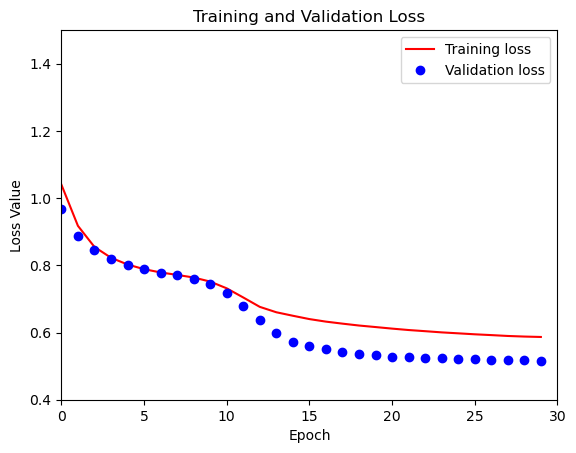

In [8]:
## Training and Validation Loss (L-curve)
import matplotlib.pyplot as plt
# produces L-curve 
loss = unet_model.history.history['loss']
val_loss = unet_model.history.history['val_loss']

plt.figure()
plt.plot( loss, 'r', label='Training loss')
plt.plot( val_loss, 'bo', label='Validation loss')
plt.title('Training and Validation Loss')
plt.xlabel('Epoch')
plt.ylabel('Loss Value')
plt.xlim([0, 30])
plt.ylim([0.4, 1.5])
plt.legend()
plt.show()
#plt.savefig("training_validation_loss_HVsingle_9_26.png")

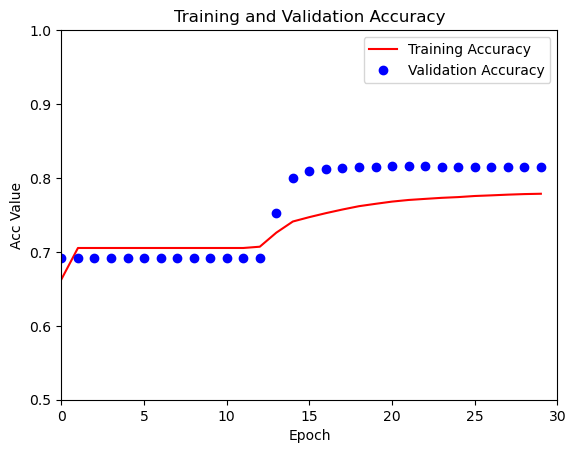

In [9]:
## Training and Validation Accuracy L-curve
acc = unet_model.history.history['sparse_categorical_accuracy']
val_acc = unet_model.history.history['val_sparse_categorical_accuracy']
# produces L-curve (monitor elbow of the L)
plt.figure()
plt.plot( acc, 'r', label='Training Accuracy')
plt.plot( val_acc, 'bo', label='Validation Accuracy')
plt.title('Training and Validation Accuracy')
plt.xlabel('Epoch')
plt.ylabel('Acc Value')
plt.xlim([0, 30])
plt.ylim([0.5, 1])
plt.legend()
plt.show()
#plt.savefig("training_validation_acc_HVsingle_9_26.png")

In [2]:
# Launch Tensorboard with the appropriate log directory (if subdirectories are not mentioned, then all runs will be displayed)
# Also mention port could be 6007, 6008 onwards. The default is 6006. In case if a tensorboard is already running, use a different port to launch a new instance ig
%tensorboard --logdir crevasse_data --port=6006

## Test Model Prediction on HH-single, HV-single, HV-median Sentinel-1 Images

In [25]:
# Load HH single images as TF dataset
HH_single_image_dataset = tf.data.Dataset.list_files("./gris/Images_HH_single/Valid/*.png", shuffle=False)
HH_single_image_dataset = HH_single_image_dataset.map(read_image, num_parallel_calls=tf.data.AUTOTUNE)

# Load HV single images as TF dataset
HV_single_image_dataset = tf.data.Dataset.list_files("./gris/Images_HV_single/Valid/*.png", shuffle=False)
HV_single_image_dataset = HV_single_image_dataset.map(read_image, num_parallel_calls=tf.data.AUTOTUNE)

# Load HV Median images as TF dataset
HV_med_image_dataset = tf.data.Dataset.list_files("./gris/Images_HV_median/Valid/*.png", shuffle=False)
HV_med_image_dataset = HV_med_image_dataset.map(read_image, num_parallel_calls=tf.data.AUTOTUNE)

# Load validation Labels (same labels for all modes)
test_label_dataset = tf.data.Dataset.list_files("./gris/Labels_512/Valid/*.png", shuffle=False)
test_label_dataset = test_label_dataset.map(read_mask, num_parallel_calls=tf.data.AUTOTUNE)

# Zip labels with individual mode image datasets
HH_single_ds = tf.data.Dataset.zip((HH_single_image_dataset,test_label_dataset))
HV_single_ds = tf.data.Dataset.zip((HV_single_image_dataset,test_label_dataset))
HV_med_ds = tf.data.Dataset.zip((HV_med_image_dataset,test_label_dataset))

### HH-single Prediction and Evaluation Metrics

In [26]:
HH_single_prediction = unet_model.predict(HH_single_ds.batch(batch_size=1))
HH_single_evaluation = unet_model.evaluate(HH_single_ds.batch(batch_size=1))

4/4 [==============================] - 0s 70ms/step - loss: 1.0239 - sparse_categorical_accuracy: 0.4148 - sparse_categorical_crossentropy: 1.0239 - io_u_1: 0.7364 - mean_iou: 0.3017 - dice_coefficient: 0.6095


### HV-single Prediction and Evaluation Metrics

In [27]:
HV_single_prediction = unet_model.predict(HV_single_ds.batch(batch_size=1))
HV_single_evaluation = unet_model.evaluate(HV_single_ds.batch(batch_size=1))

4/4 [==============================] - 0s 66ms/step - loss: 1.2011 - sparse_categorical_accuracy: 0.4042 - sparse_categorical_crossentropy: 1.2011 - io_u_1: 0.7364 - mean_iou: 0.3000 - dice_coefficient: 0.6088


### HV-median Prediction and Evaluation Metrics

In [28]:
HV_med_prediction = unet_model.predict(HV_med_ds.batch(batch_size=1))
HV_med_evaluation = unet_model.evaluate(HV_med_ds.batch(batch_size=1))

4/4 [==============================] - 0s 68ms/step - loss: 0.6656 - sparse_categorical_accuracy: 0.6919 - sparse_categorical_crossentropy: 0.6656 - io_u_1: 0.7364 - mean_iou: 0.3043 - dice_coefficient: 0.6093


In [ ]:
def create_mask(pred_mask):
  pred_mask = pred_mask[..., tf.newaxis]
  pred_mask = tf.math.argmax(pred_mask, axis=-1)
  return pred_mask[0]

def show_predictions(dataset=None, num=1):
  if dataset:
    for image, mask in dataset.take(num):
      pred_mask = unet_model.predict(image)
      display([image[0], mask[0], create_mask(pred_mask)])
  else:
    display([sample_image, sample_mask,
             create_mask(unet_model.predict(sample_image[tf.newaxis, ...]))])
show_predictions(train_ds, 3)

### Prediction Plot for HH-single images

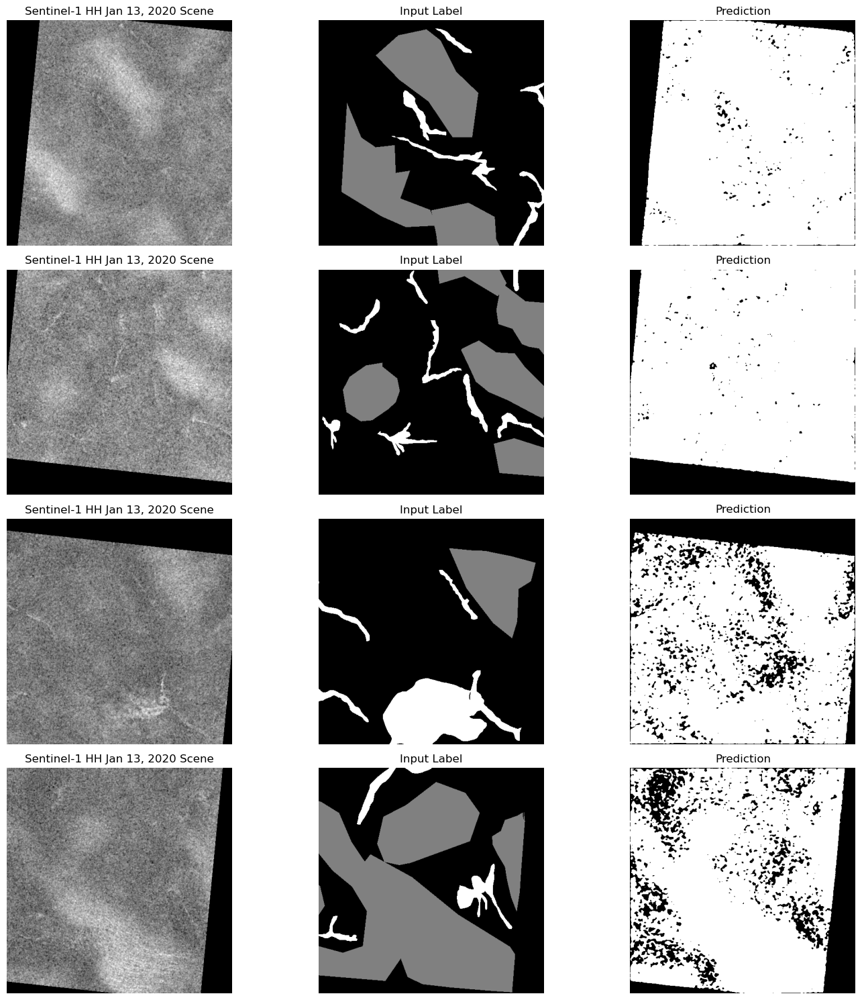

In [43]:
from unet import utils
import numpy as np
fig, ax = plt.subplots(4, 3, sharex=True, sharey=True, figsize=(15,15))
dataset = HH_single_ds.map(utils.crop_image_and_label_to_shape(HH_single_prediction.shape[1:]))

for i, (image, label) in enumerate(dataset.take(4)):
    ax[i][0].imshow(image[..., -1],cmap=plt.cm.gray); ax[i][0].set_title('Sentinel-1 HH Jan 13, 2020 Scene'); ax[i][0].axis('off')
    ax[i][1].imshow(label[...],cmap=plt.cm.gray); ax[i][1].set_title('Input Label'); ax[i][1].axis('off')
    ax[i][2].imshow(np.argmax(HH_single_prediction[i,...],axis=-1),cmap=plt.cm.gray); ax[i][2].set_title('Prediction'); ax[i][2].axis('off')
plt.tight_layout()

### Prediction Plot for HV-single images

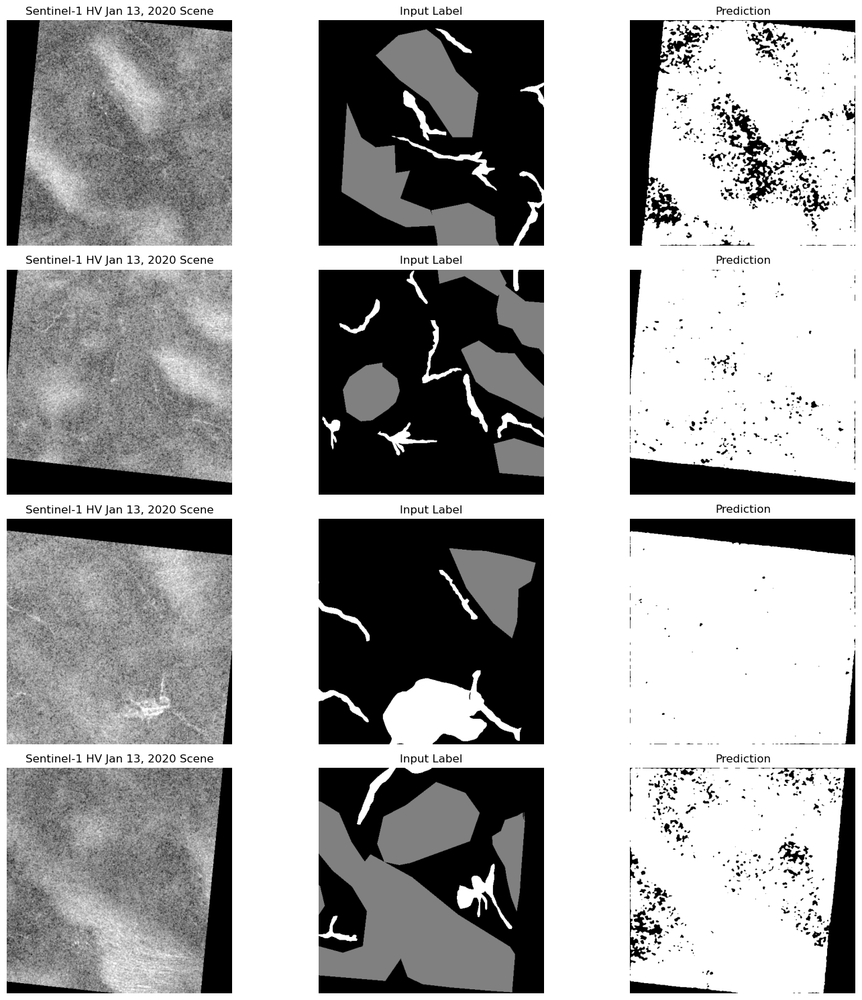

In [44]:
from unet import utils
import numpy as np
fig, ax = plt.subplots(4, 3, sharex=True, sharey=True, figsize=(15,15))
dataset = HV_single_ds.map(utils.crop_image_and_label_to_shape(HV_single_prediction.shape[1:]))

for i, (image, label) in enumerate(dataset.take(4)):
    ax[i][0].imshow(image[..., -1],cmap=plt.cm.gray); ax[i][0].set_title('Sentinel-1 HV Jan 13, 2020 Scene'); ax[i][0].axis('off')
    ax[i][1].imshow(label[...],cmap=plt.cm.gray); ax[i][1].set_title('Input Label'); ax[i][1].axis('off')
    ax[i][2].imshow(np.argmax(HV_single_prediction[i,...],axis=-1),cmap=plt.cm.gray); ax[i][2].set_title('Prediction'); ax[i][2].axis('off')
plt.tight_layout()

### Prediction Plot for HV-median images

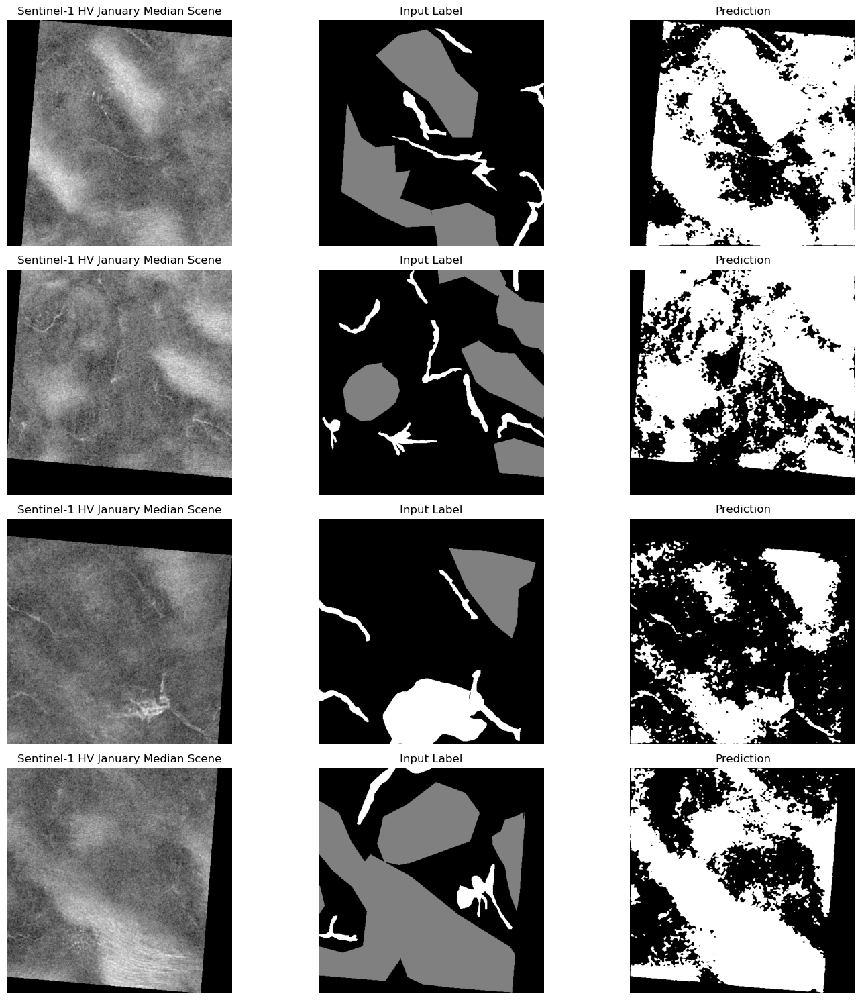

In [45]:
from unet import utils
import numpy as np
fig, ax = plt.subplots(4, 3, sharex=True, sharey=True, figsize=(15,15))
dataset = HV_med_ds.map(utils.crop_image_and_label_to_shape(HV_med_prediction.shape[1:]))

for i, (image, label) in enumerate(dataset.take(4)):
    ax[i][0].imshow(image[..., -1],cmap=plt.cm.gray); ax[i][0].set_title('Sentinel-1 HV January Median Scene'); ax[i][0].axis('off')
    ax[i][1].imshow(label[...],cmap=plt.cm.gray); ax[i][1].set_title('Input Label'); ax[i][1].axis('off')
    ax[i][2].imshow(np.argmax(HV_med_prediction[i,...],axis=-1),cmap=plt.cm.gray); ax[i][2].set_title('Prediction'); ax[i][2].axis('off')
plt.tight_layout()

In [7]:
tf.keras.utils.get_custom_objects()

{'Custom>Adadelta': keras.optimizers.optimizer_experimental.adadelta.Adadelta,
 'Custom>Adagrad': keras.optimizers.optimizer_experimental.adagrad.Adagrad,
 'Custom>Adam': keras.optimizers.optimizer_experimental.adam.Adam,
 'Custom>Adamax': keras.optimizers.optimizer_experimental.adamax.Adamax,
 'Custom>AdamW': keras.optimizers.optimizer_experimental.adamw.AdamW,
 'Custom>Ftrl': keras.optimizers.optimizer_experimental.ftrl.Ftrl,
 'Custom>Nadam': keras.optimizers.optimizer_experimental.nadam.Nadam,
 'Custom>RMSprop': keras.optimizers.optimizer_experimental.rmsprop.RMSprop,
 'Custom>SGD': keras.optimizers.optimizer_experimental.sgd.SGD,
 'Custom>SharpnessAwareMinimization': keras.models.sharpness_aware_minimization.SharpnessAwareMinimization}

In [15]:
Sep_28_T_15_04_19 = tf.keras.models.load_model('./crevasse_data/2023-09-28T15-04_19', compile=False)

# Check its architecture
Sep_28_T_15_04_19.history.params



AttributeError: 'NoneType' object has no attribute 'params'

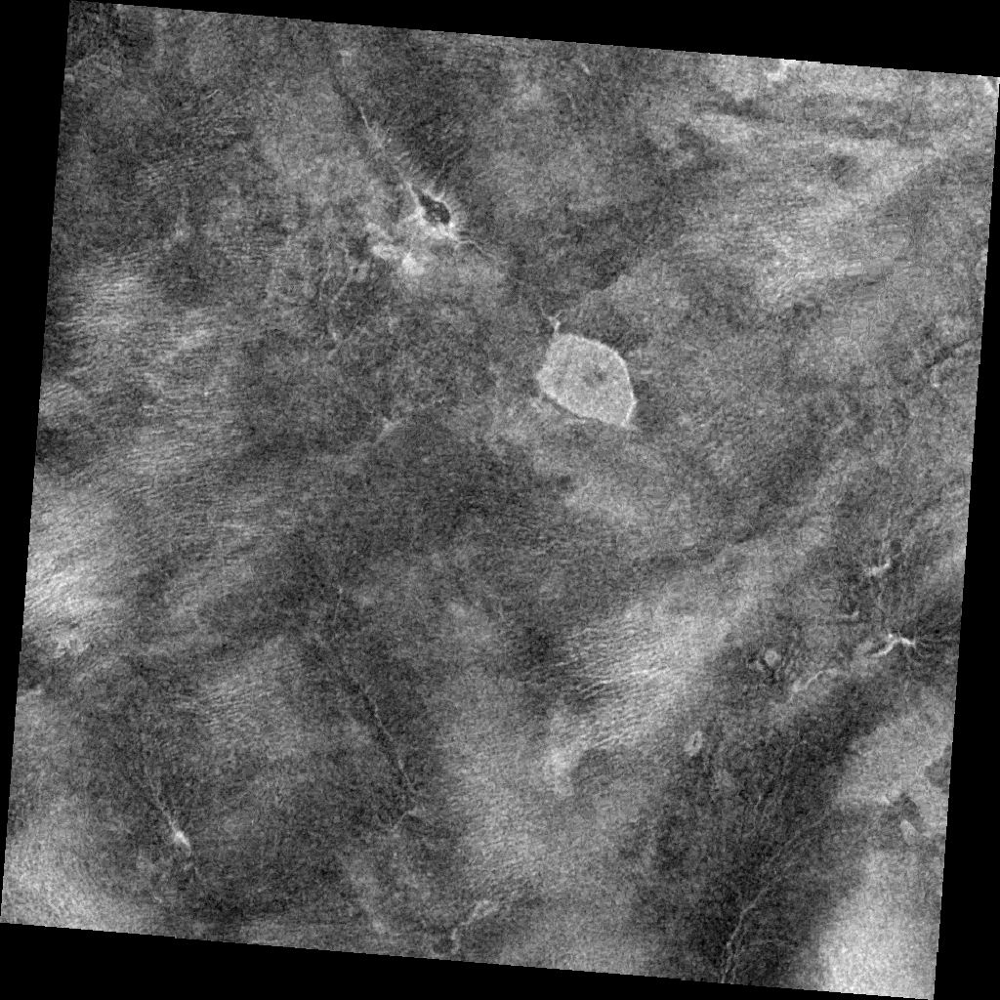

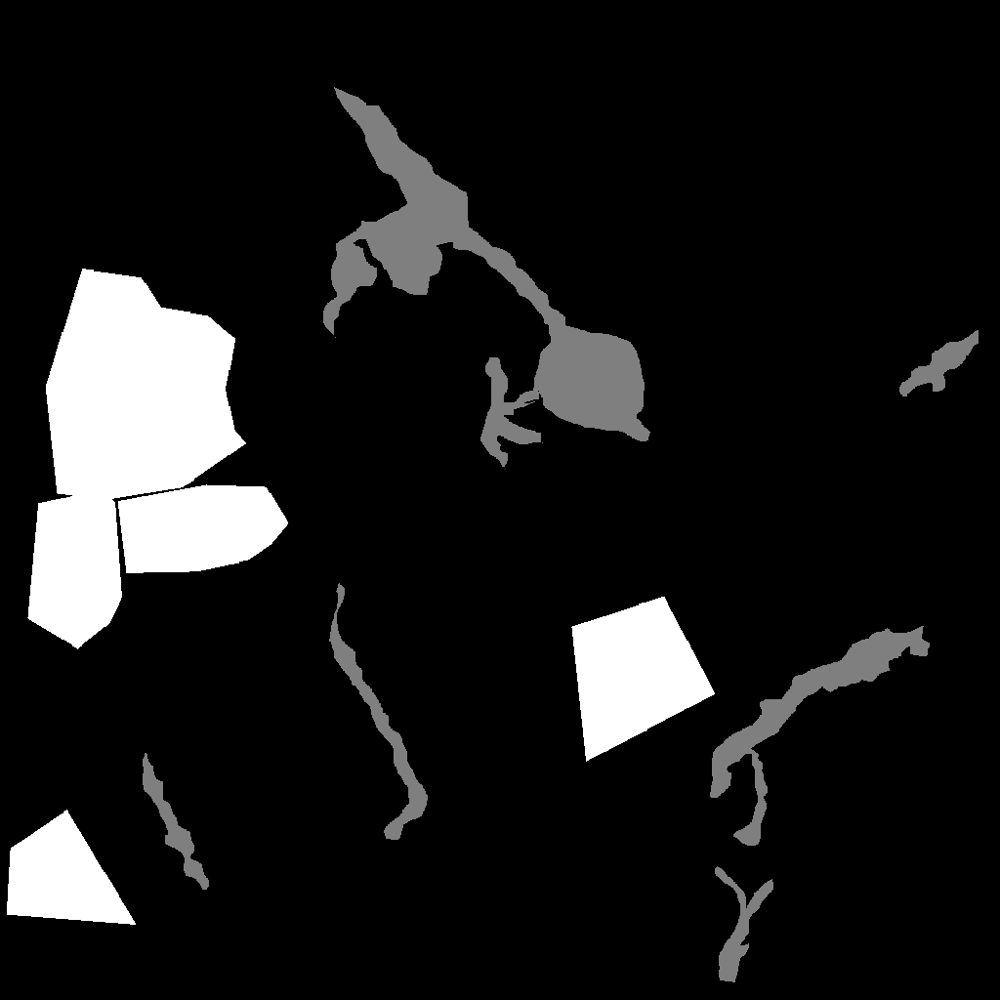

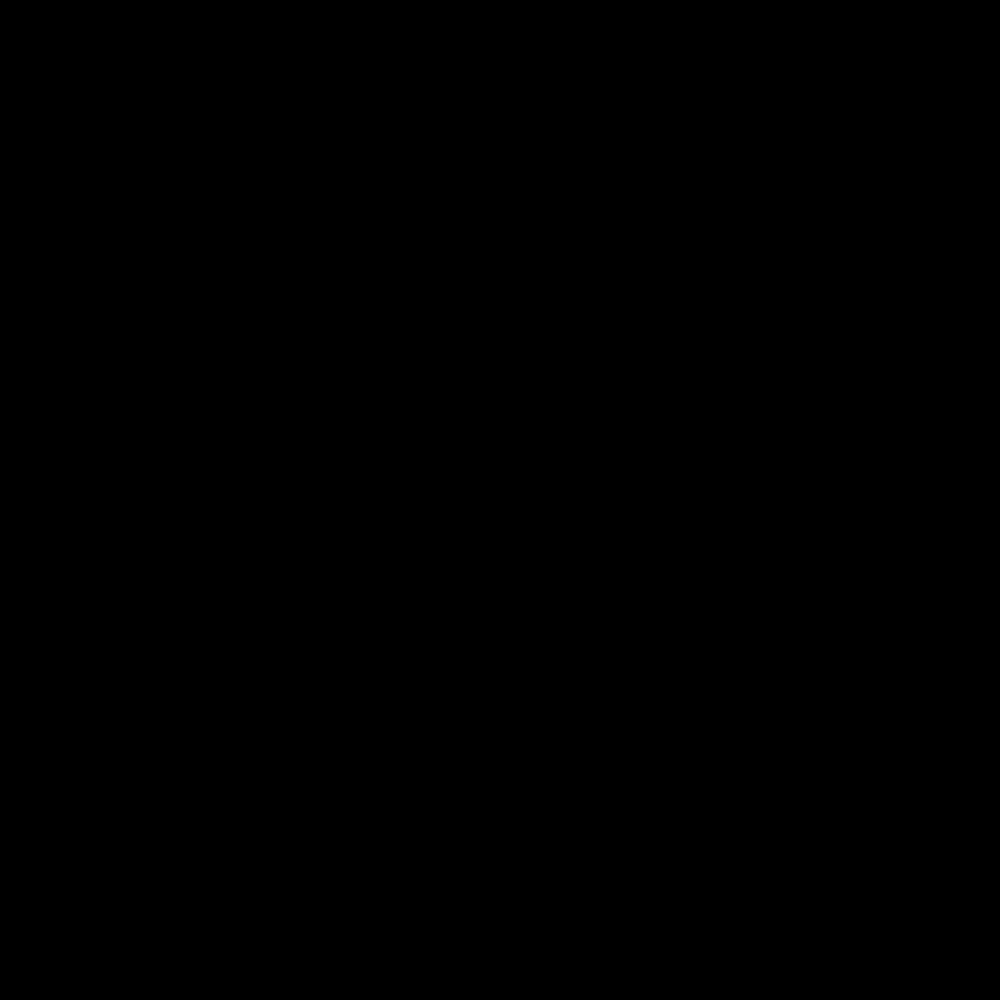

In [27]:
# Generate predictions for all images in the training set

# model.predict can be used for any image (label not required)

def display_mask(i):
    """Quick utility to display a model's prediction."""
    mask = np.argmax(prediction[i,...], axis=-1)
    mask = np.expand_dims(mask, axis=-1)
    img = PIL.ImageOps.autocontrast(keras.preprocessing.image.array_to_img(mask,scale=False))
    display(img)


# Display results for image #1
i = 1

IMAGE_DIR_PATH = "./gris/Images/Train/"
MASK_DIR_PATH = "./gris/Labels/Train/"
image_path = sorted([os.path.join(IMAGE_DIR_PATH, x) for x in os.listdir(IMAGE_DIR_PATH) if x.endswith('.png')])
label_path = sorted([os.path.join(MASK_DIR_PATH, x) for x in os.listdir(MASK_DIR_PATH) if x.endswith('.png')])
# Display input image
display(load_img(image_path[i]))

# Display ground-truth target mask
img = PIL.ImageOps.autocontrast(load_img(label_path[i]))
display(img)

# Display mask predicted by our model
display_mask(i)
# save predictions to a folder
# make false-color color map on the prediction 